In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import matplotlib.image as mpimg
import scipy.misc
#from google.colab.patches import cv2_imshow

In [2]:
def plot2Images(img, dst, titleImg = "Original", titleDst = "Resultado"):
    plt.subplots(figsize=(24, 14))
    plt.subplot(121), plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)),plt.title(titleImg)
    #plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(cv.cvtColor(dst, cv.COLOR_BGR2RGB)),plt.title(titleDst)
    #plt.xticks([]), plt.yticks([])
    plt.show()

def plotImage(img, title=""):
    plt.subplots(figsize=(20, 11))
    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)),plt.title(title) # cmap = 'gray' para preto e branco
    plt.xticks([]), plt.yticks([])
    plt.show()

def plotGrayImage(img, title=""):
    plt.subplots(figsize=(16, 11))
    plt.imshow(img, cmap='gray'),plt.title(title) # cmap = 'gray' para preto e branco
    plt.xticks([]), plt.yticks([])
    plt.show()

#**Trocar Canais de Cores**

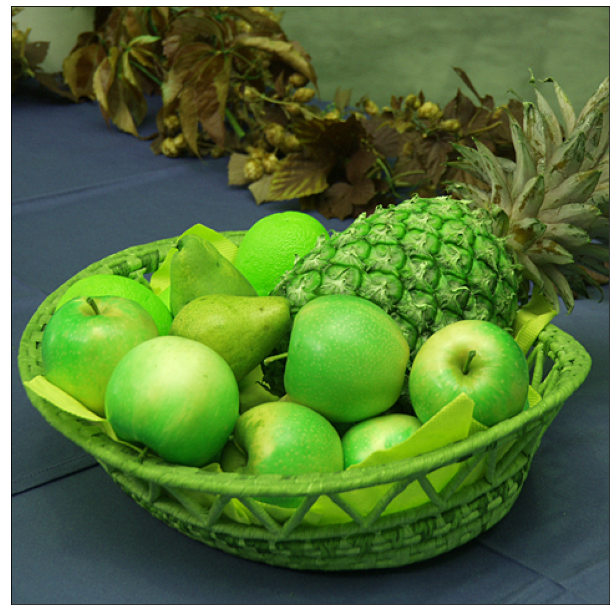

In [ ]:
img = cv.imread('Fruits-RGB.tif')

b, g, r = cv.split(img)

plotImage(cv.merge((b, r, g)))

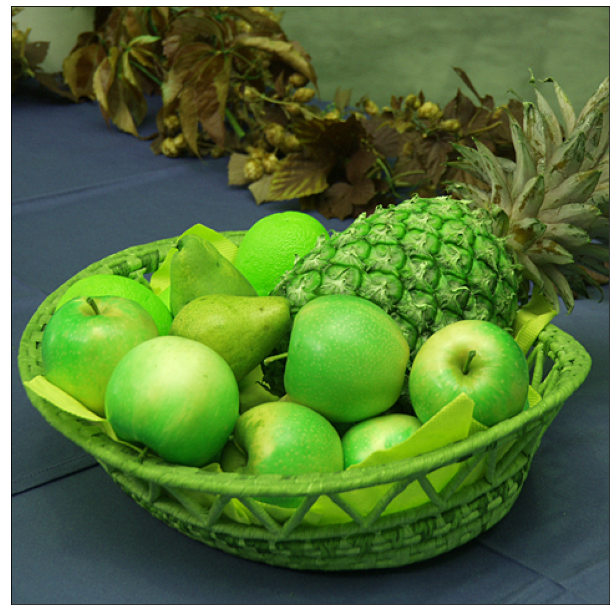

In [ ]:
img = cv.imread('Fruits-RGB.tif')

#imgC1 = img.copy()
#imgC1[:, :, 2] = 0
#imgC1[:, :, 0] = 0
#plotImage(imgC1)

green = img[:, :, 1].copy()
img[:, :, 1] = img[:, :, 2] #Fica BRR
img[:, :, 2] = green # Fica BRG

plotImage(img)

#**Laplaciana**

In [ ]:
def Laplacian(img): 
    LaplacianKernel = np.array([[0, 1, 0],
                                [1, -4, 1],
                                [0, 1, 0]])

    return cv.filter2D(src=img, ddepth=-1, kernel=LaplacianKernel)


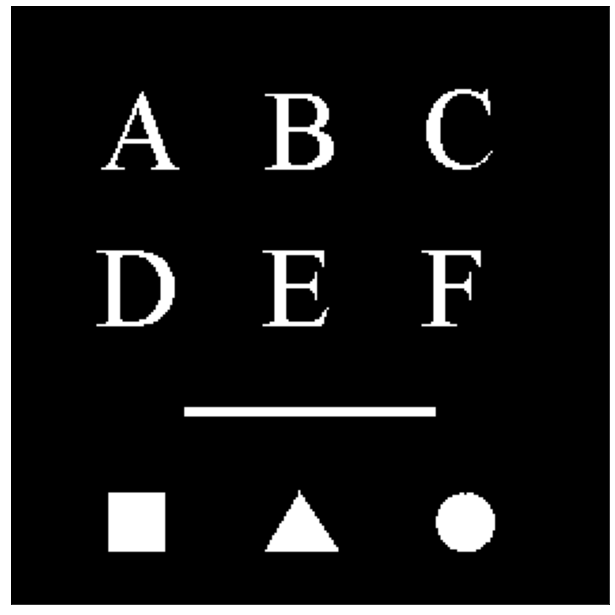

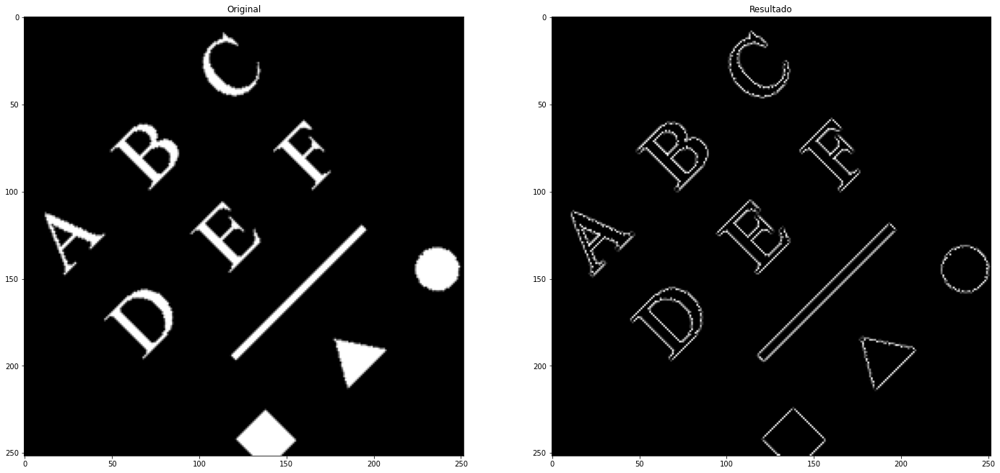

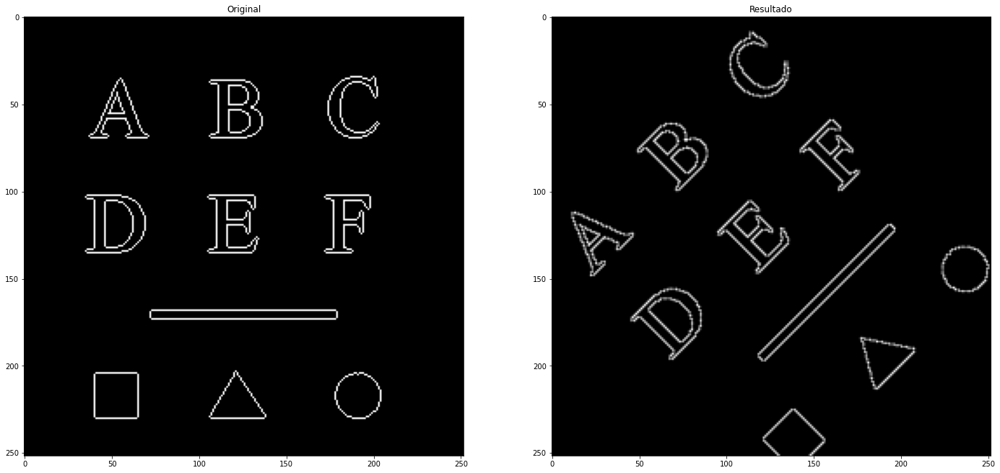

In [ ]:
img = cv.imread('ten-objects.tif')

plotImage(img)

# Rotation e depois laplacian

height, width, _ = img.shape

theta = 45
midPoint = (width/2, height/2)
R = cv.getRotationMatrix2D(midPoint, angle=theta, scale=1)
rotated = cv.warpAffine(img, R, (width, height))

#imgResult1 = cv.Laplacian(rotated, 8)
imgResult1 = Laplacian(rotated)

plot2Images(rotated, imgResult1)

# laplacian e depois rotation

#edges = cv.Laplacian(img, 8)

edges = Laplacian(img)

height, width, _ = edges.shape

theta = 45
midPoint = (width/2, height/2)
R = cv.getRotationMatrix2D(midPoint, angle=theta, scale=1)
imgResult2 = cv.warpAffine(edges, R, (width, height))

plot2Images(edges, imgResult2)

# possuem o msm resultado, pois o filtro laplaciano é isotrópica, então cria bordas uniformes em todas as direções.

#**Gerar imagem**

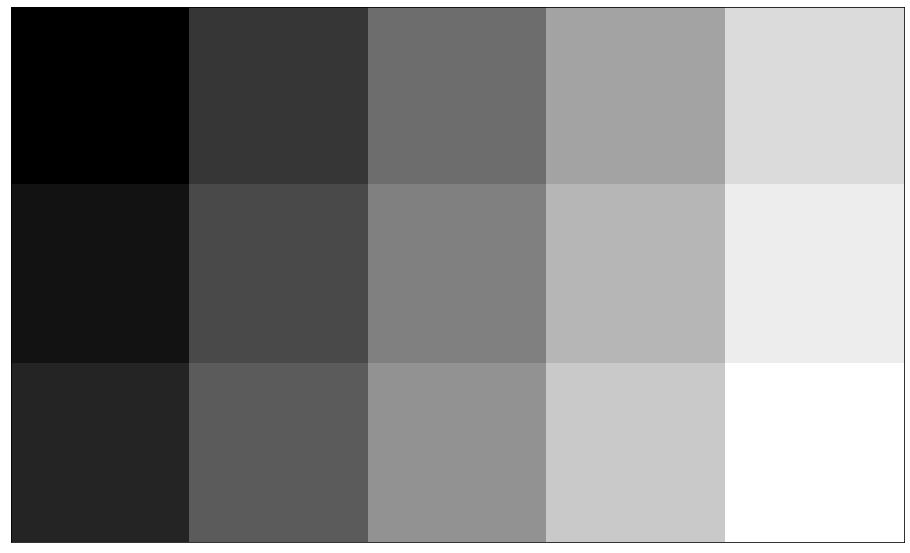

In [ ]:
def generateImage(shape=(0, 0), axis=1):
    width, height = shape
    array = np.arange(0, width*height)

    if axis == 1:
        img = array.reshape(height, width)
    elif axis == 0:
        img = array.reshape(width, height).transpose() # faço um reshape do array de tal forma que a transposta dela tenha o resultado que eu queira

    return img

plotGrayImage(generateImage((5, 3), axis=0))

#**Ruído sal e pimenta**

In [ ]:
def gaussian(range):
    x = np.arange(range)
    y = np.arange(range)

    xx, yy = np.meshgrid(x, y)
    sigma = 0.3*((range-1)*0.5 - 1) + 0.8

    # Deslocando o centro da gaussiana
    half = int(range/2)
    xx = xx - half
    yy = yy - half

    # Calculando a função gaussiana
    zz = (1/(2*np.pi*(sigma**2)))*np.exp(-(xx**2 + yy**2)/(2*sigma**2))
    #plotContourf(xx, yy, normalize(zz), 'Gaussian Bidimensional')
    #plot3d(xx, yy, normalize(zz), "Gaussian Bidimensional 3D")
    return zz

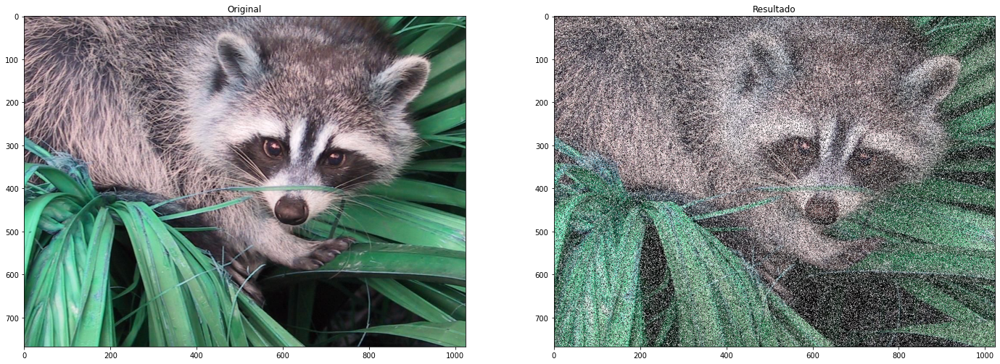

In [ ]:
img = scipy.misc.face()

img = img.copy()
imgNoise = img.copy()
for i in range(int(img.shape[0]*img.shape[1]/2)):
    x = np.random.randint(0, img.shape[1]-1)
    y = np.random.randint(0, img.shape[0]-1)

    if i % 2:
        imgNoise[y, x] = 255 # insere o ruído aleatoriamente
    else:
        imgNoise[y, x] = 0
        
plot2Images(img, imgNoise)


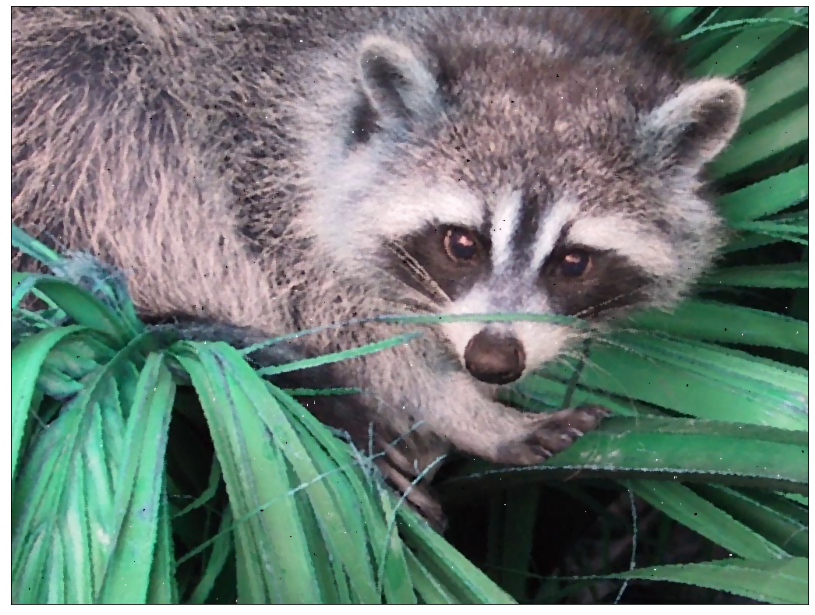

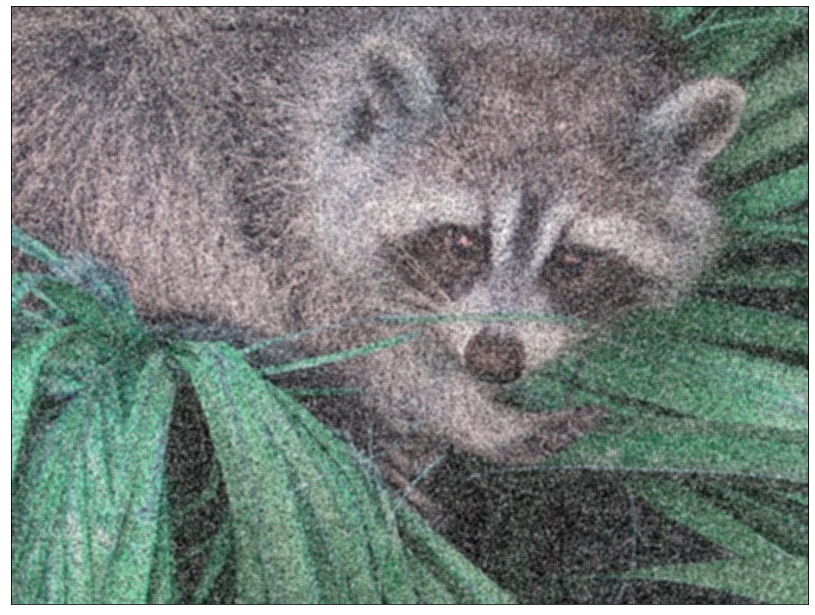

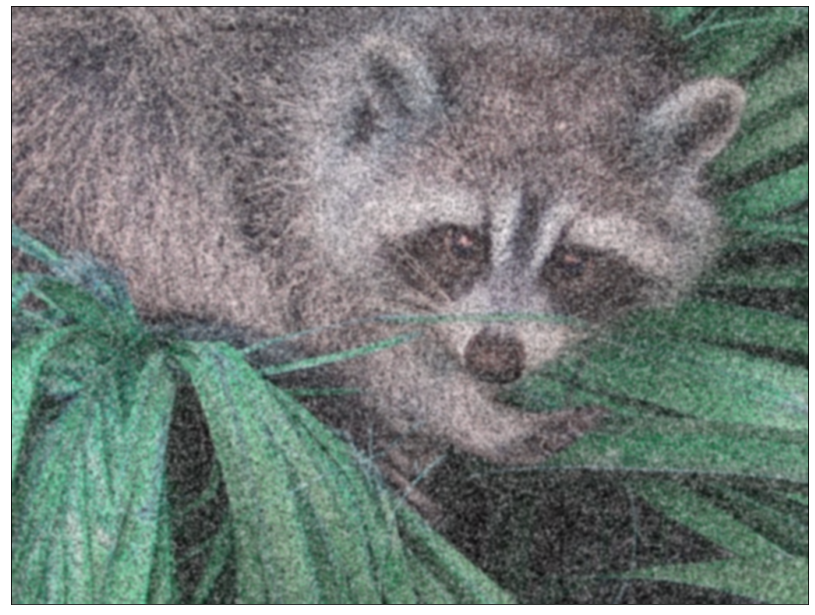

In [ ]:
plotImage(cv.medianBlur(imgNoise, 5))
plotImage(cv.GaussianBlur(imgNoise, (5, 5), cv.BORDER_DEFAULT))
plotImage(cv.filter2D(imgNoise, ddepth=-1, kernel=gaussian(10)))

Uma imagem binária não comprimida de tamanho 
4000
×
3000
 pixels.

In [ ]:
4000*3000/8 # valor em bytes

1500000.0

Uma imagem colorida no espaço de cor RGB de tamanho 
640
×
480
 pixels usando 8, 10 ou 12 bits por canal de cor

In [ ]:
print(640*480*3*8/8, 640*480*3*10/8, 640*480*3*12/8) # valores em bytes para rgb com 8, 10 e 12 bits

921600.0 1152000.0 1382400.0


O sensor de uma câmera digital específica contém 
2016
×
3024
(
H
×
W
)
 pixels. A geometria do sensor é idêntica a de uma câmera 35mm tradicional (com uma imagem de tamanho 
24
×
36
mm) exceto por ser 1.6 vezes menor. Calcule a resolução deste sensor digital em dpi.

In [ ]:
inchH = (24/1.6)*0.0393701
inchW = (36/1.6)*0.0393701

print(3024/(inchW))# resolução altura / polegadas altura, ou resolução largura / polegadas largura

3413.7581565705955


#**Thresholding**

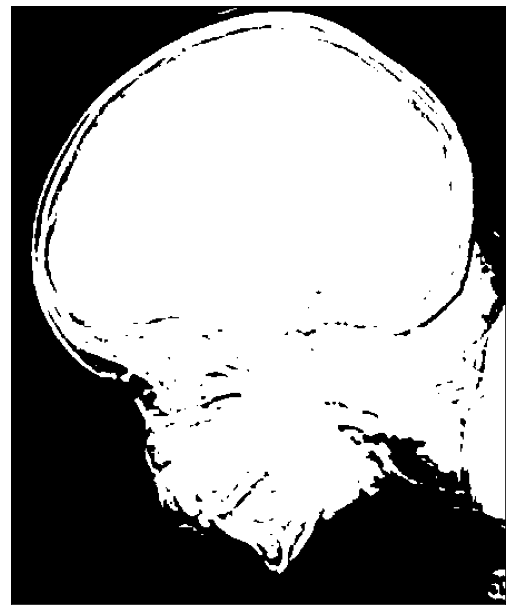

In [16]:
img = cv.imread('ct.png')

ret, threshResult = cv.threshold(img, 127, 255, cv.THRESH_BINARY) # todos os valores abaixo de 127 são definidos como 0, enquanto os maiores para 255

plotImage(threshResult)

#**Niveis de intensidade**

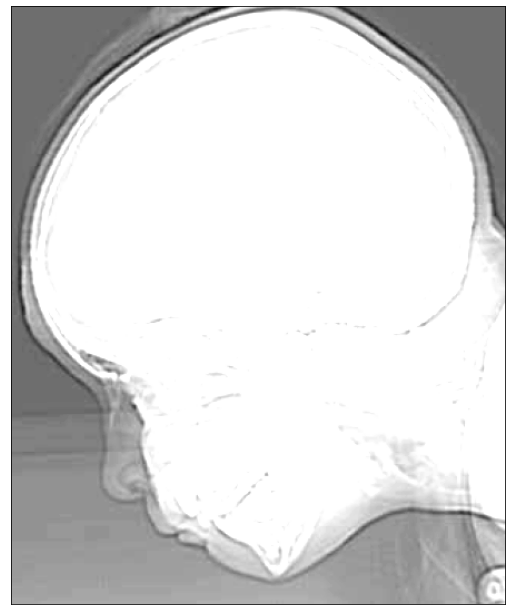

In [31]:
img = cv.imread('ct.png')

kernelIntensity = np.array([2])

#img = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX)# normalização

plotImage(cv.filter2D(src=img, ddepth=-1, kernel=kernelIntensity))

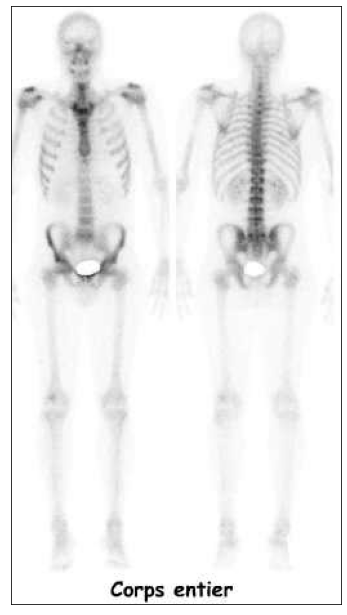

In [55]:
img = cv.imread('ca.jpg')
b, g, r = cv.split(img)

k = 8 # 0 até 8
K = (2**k - 1) # nível intensidade até 255
'''
b = K - b
g = K - g
r = K - r

img = cv.merge((b, g, r))
'''

img[:, :] = K - img[:, :]
#img = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX)# normalização

plotImage(img)

#**Bit-plane slicing**

[0 1 1]


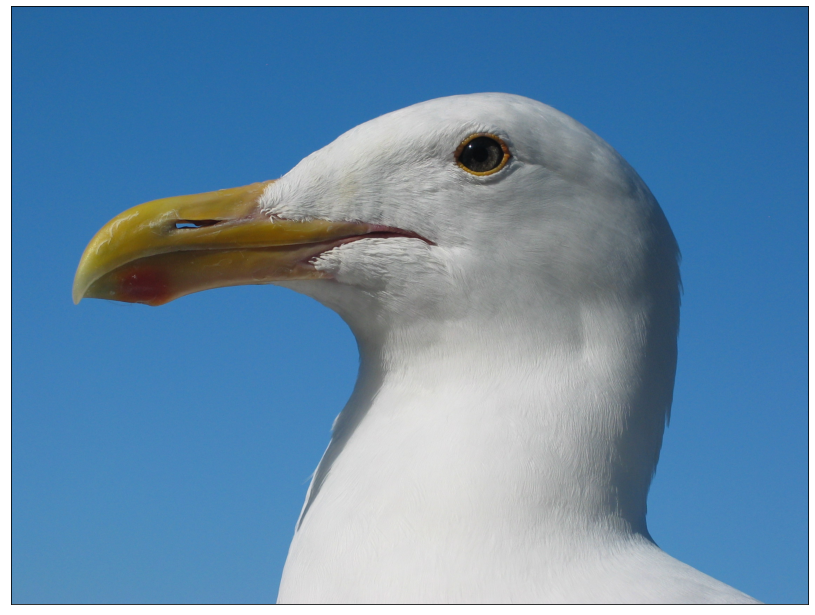

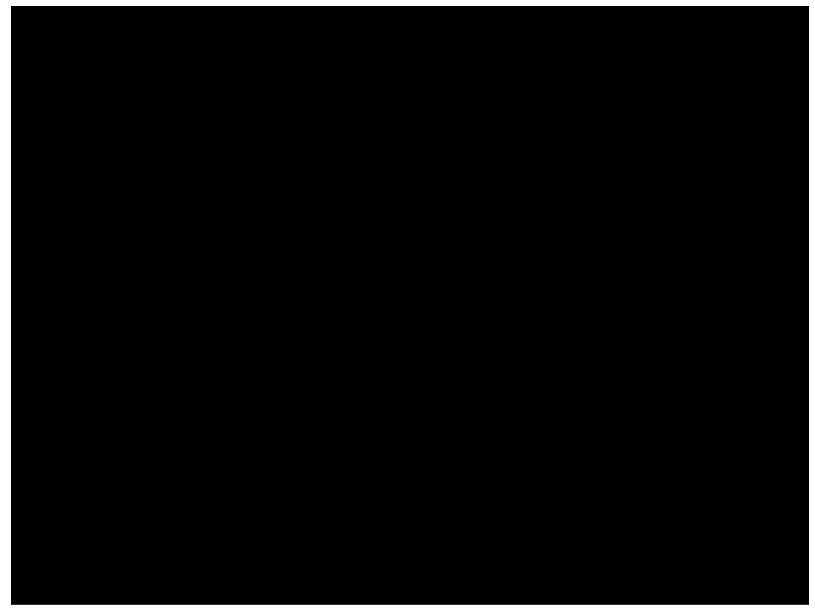

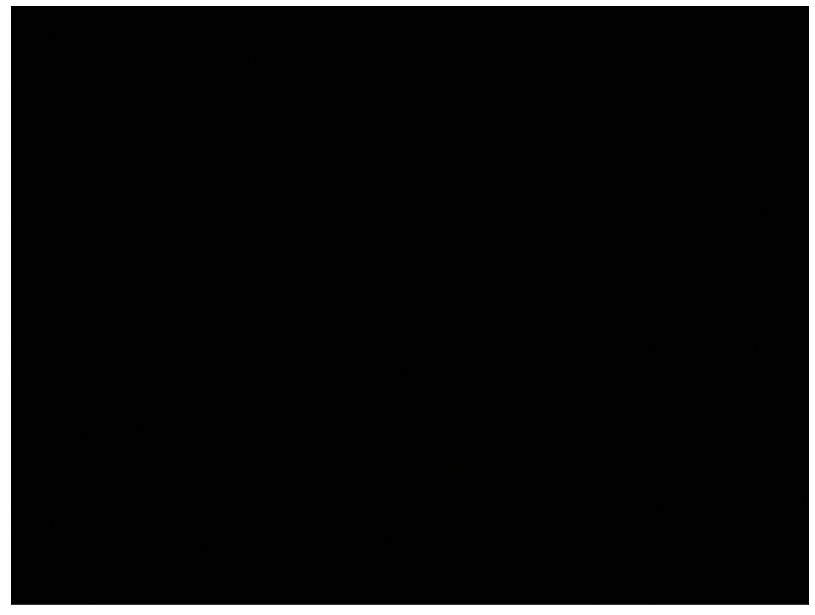

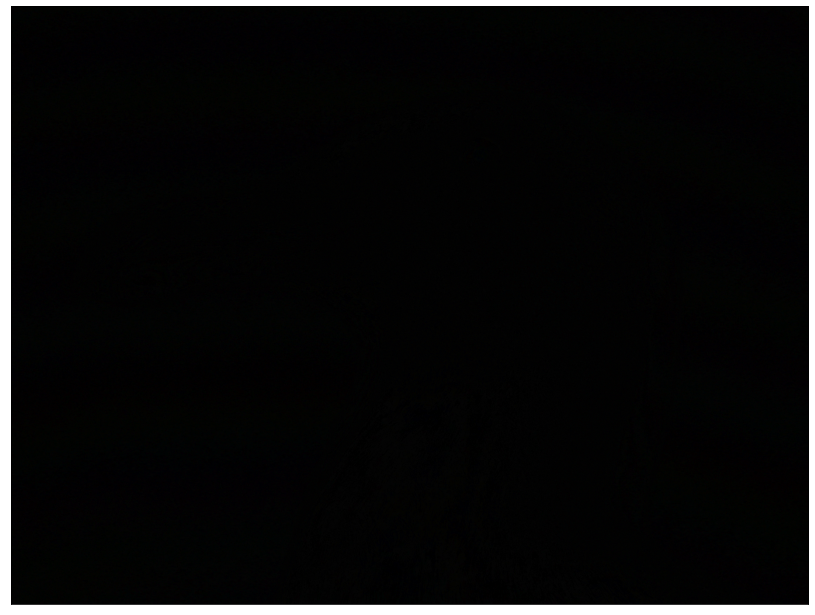

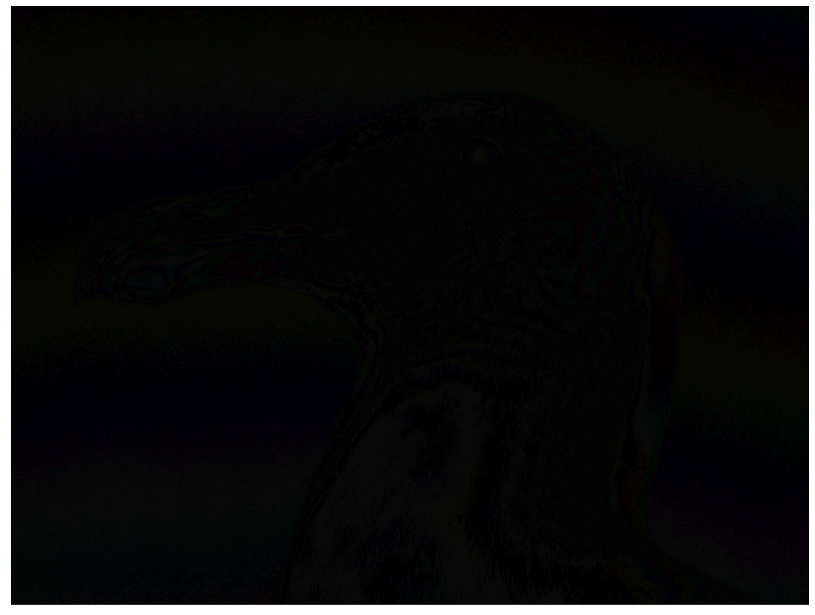

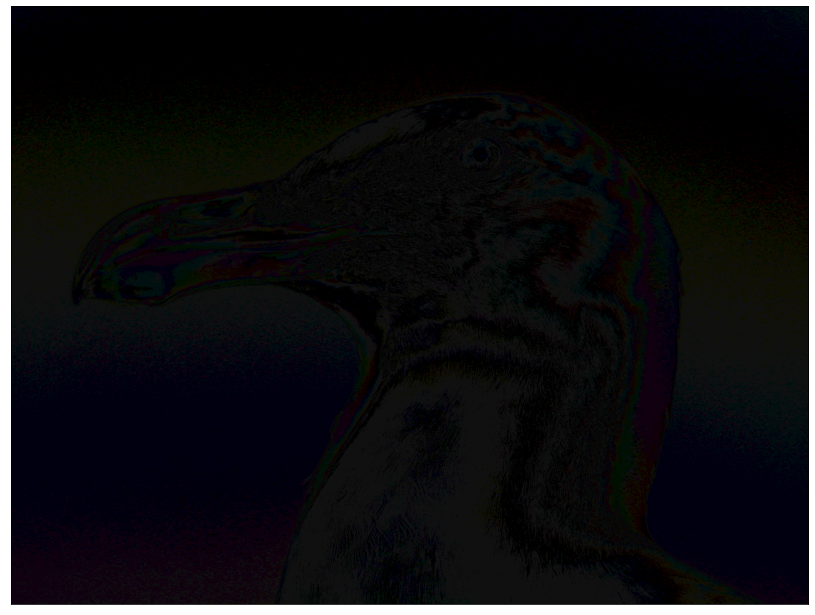

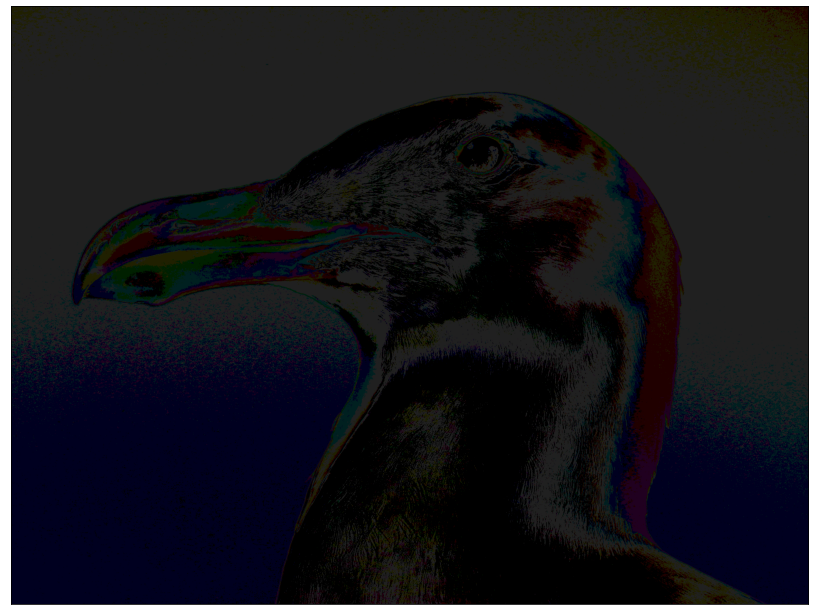

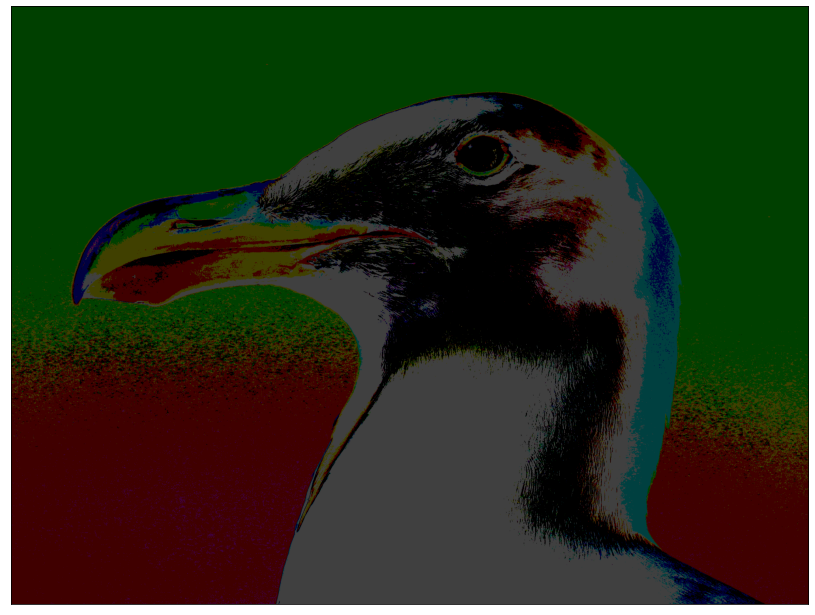

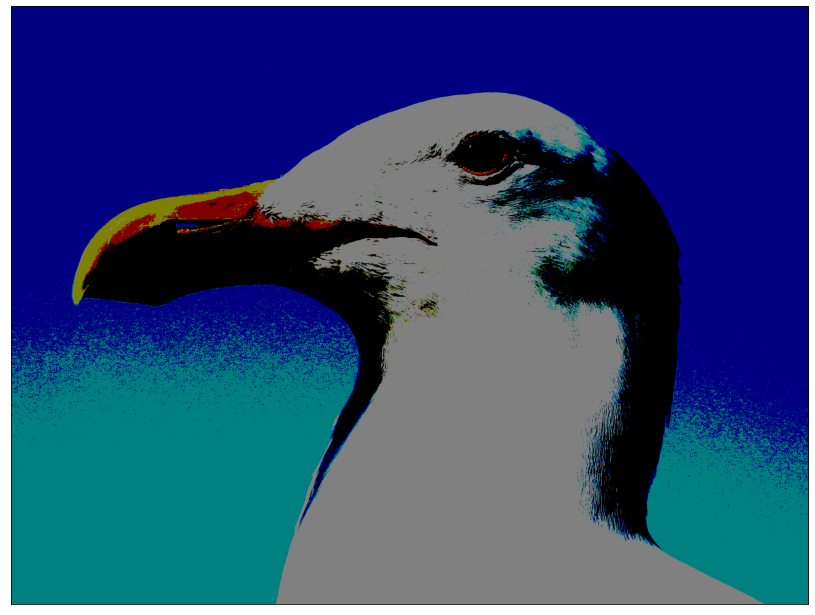

In [70]:
img = cv.imread('gaivota.jpg')

img1 = (img[:, :] & 0b00000001)
img2 = (img[:, :] & 0b00000010)
img3 = (img[:, :] & 0b00000100)
img4 = (img[:, :] & 0b00001000)
img5 = (img[:, :] & 0b00010000)
img6 = (img[:, :] & 0b00100000)
img7 = (img[:, :] & 0b01000000)
img8 = (img[:, :] & 0b10000000)
print((img[:, :] & 0b00000001)[0, 0])
img = img1[:, :]+img2[:, :]+img3[:, :]+img4[:, :]+img5[:, :]+img6[:, :]+img7[:, :]+img8[:, :]

plotImage(img)


plotImage(img1)
plotImage(img2)
plotImage(img3)
plotImage(img4)
plotImage(img5)
plotImage(img6)
plotImage(img7)
plotImage(img8)

#**Equalização de Histograma**

In [83]:
def plot_histogram(img):
    # Grayscale image
    if len(img.shape) == 2:
        hist = cv.calcHist([img], [0], None, histSize=[256], ranges=[0, 256])
        plt.plot(hist, color='k')
        plt.show()
    # Color image
    elif len(img.shape) == 3:
        color = ('r', 'g', 'b')
        for i, col in enumerate(color):
            hist = cv.calcHist([img], [i], None, histSize=[256], ranges=[0, 256])
            plt.plot(hist, color=col)
            plt.xlim([0, 256])
    plt.show()
    return None

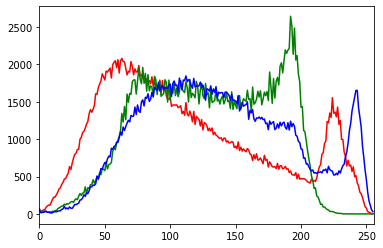

<function matplotlib.pyplot.show(*args, **kw)>

In [84]:
img = cv.imread('baboon.png')

#plt.imshow(img, cmap='gray', vmin=0, vmax=255)
plot_histogram(img)
plt.show

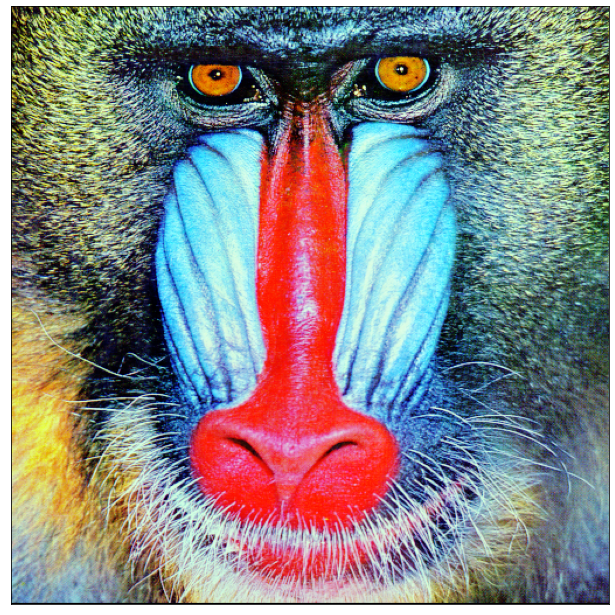

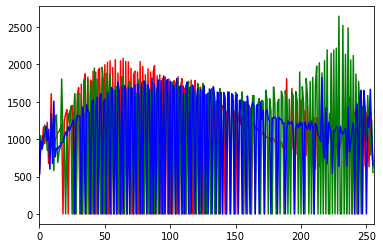

In [85]:
b, g, r = cv.split(img)

bNew = cv.equalizeHist(b)
gNew = cv.equalizeHist(g)
rNew = cv.equalizeHist(r)

newImg = cv.merge((bNew, gNew, rNew))

plotImage(newImg)

plot_histogram(newImg)

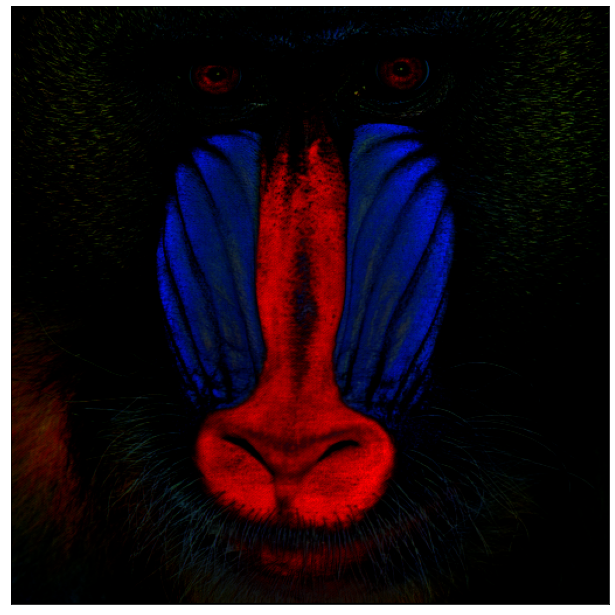

In [90]:
img = cv.imread('baboon.png')

#c = 1; gamma = 0.6
def adjust_gamma(image, gamma):
	# build a lookup table mapping the pixel values [0, 255] to
	# their adjusted gamma values
	invGamma = 1.0 / gamma
	table = np.array([((i / 255.0) ** invGamma) * 255
		for i in np.arange(0, 256)]).astype("uint8")
	# apply gamma correction using the lookup table
	return cv.LUT(image, table)
img = adjust_gamma(img, gamma=0.1)
plotImage(img)